## **Import necessary Libraries**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score


# **Ethical considerations**

In [ ]:
#Implement an "opt-out" mechanism for data subjects
def load_sensitive_data():
    #data = df
    #return data

# Add a variable to follow the statut of opt-out
  opt_out_status = False

# Fonction to activate l'opt-out
def opt_out():
    global opt_out_status
    opt_out_status = True

# Add this fonction where sensitives data is treated
def process_sensitive_data(data):
    if opt_out_status:
        print("L'opt-out est activé. Les données sensibles ne seront pas traitées.")
        return


# if the user choses the opt-out, call the fonction opt_out()
opt_out()

# After treating sensitives data , call the fonction process_sensitive_data(data) to verify l'opt-out.
data = load_sensitive_data()  # sensitives data
process_sensitive_data(data)  # Verufy if the opt-out is activated before treating the data



L'opt-out est activé. Les données sensibles ne seront pas traitées.


In [ ]:
# Load the existing dataset (replace 'your_dataset.csv' with the actual file path)
df = pd.read_csv('dataset.csv')

In [ ]:
df.head()

,years_of_experience,functional_competency_score,top1_skills_score,top2_skills_score,top3_skills_score,behavior_competency_score,top1_behavior_skill_score,top2_behavior_skill_score,top3_behavior_skill_score,call_for_interview
0,0.333333,0.749498,0.777778,0.7,0.8,0.769231,0.931689,0.662042,0.752463,1
1,0.133333,0.490638,0.777778,0.3,0.4,0.153846,0.352093,0.132231,0.316905,0
2,0.000000,0.460256,0.444444,0.3,0.3,0.051282,0.052347,0.089765,0.254859,0
3,0.000000,0.507347,0.555556,0.4,0.5,0.384615,0.309913,0.289758,0.440784,0
4,0.400000,0.662020,0.666667,0.7,0.5,0.461538,0.497929,0.397544,0.392760,1


# **Data augmentation**

In [ ]:
# Create a DataFrame from the original data
df1 = pd.DataFrame(df)

# Augmentation: Create new samples by adding random noise to existing data
n_augmented_samples = 2000  # Choose the number of additional samples you want to create

augmented_data = []

for _ in range(n_augmented_samples):
    augmented_sample = df.iloc[np.random.randint(len(df))]  # Select a random original sample
    noise = np.random.normal(0, 0.05, len(df.columns) - 1)  # Generate random noise for features (excluding the target)
    augmented_sample[:-1] += noise  # Add noise to the sample (excluding the target)
    augmented_data.append(augmented_sample)

# Combine the original data with the augmented data
augmented_df = df.append(augmented_data, ignore_index=True)

# Display the augmented DataFrame
print(augmented_df)


<ipython-input-5-6301f022bf09>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  augmented_sample[:-1] += noise  # Add noise to the sample (excluding the target)


      years_of_experience  functional_competency_score  top1_skills_score  \
0                0.333333                     0.749498           0.777778   
1                0.133333                     0.490638           0.777778   
2                0.000000                     0.460256           0.444444   
3                0.000000                     0.507347           0.555556   
4                0.400000                     0.662020           0.666667   
...                   ...                          ...                ...   
2295             0.043839                     0.419490           0.409238   
2296            -0.010177                     0.596438           0.466772   
2297             0.054942                     0.470496           0.479689   
2298             0.785710                     0.804210           0.989903   
2299             0.042203                     0.502811           0.555524   

      top2_skills_score  top3_skills_score  behavior_competency_score  \
0 

<ipython-input-5-6301f022bf09>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  augmented_df = df.append(augmented_data, ignore_index=True)


In [ ]:
print(augmented_df.shape)

(2300, 10)


In [ ]:
augmented_df.columns

Index(['years_of_experience', 'functional_competency_score',
       'top1_skills_score', 'top2_skills_score', 'top3_skills_score',
       'behavior_competency_score', 'top1_behavior_skill_score',
       'top2_behavior_skill_score', 'top3_behavior_skill_score',
       'call_for_interview'],
      dtype='object')

In [ ]:
print(augmented_df['call_for_interview'].head())

0    1.0
1    0.0
2    0.0
3    0.0
4    1.0
Name: call_for_interview, dtype: float64



# Feature engineering and visualisation


In [ ]:
# Ajoutez une colonne d'identifiant unique commençant à 1
augmented_df['ID'] = range(1, len(augmented_df) + 1)

# Affichez le DataFrame avec la nouvelle colonne
print(augmented_df)

      years_of_experience  functional_competency_score  top1_skills_score  \
0                0.333333                     0.749498           0.777778   
1                0.133333                     0.490638           0.777778   
2                0.000000                     0.460256           0.444444   
3                0.000000                     0.507347           0.555556   
4                0.400000                     0.662020           0.666667   
...                   ...                          ...                ...   
2295             0.043839                     0.419490           0.409238   
2296            -0.010177                     0.596438           0.466772   
2297             0.054942                     0.470496           0.479689   
2298             0.785710                     0.804210           0.989903   
2299             0.042203                     0.502811           0.555524   

      top2_skills_score  top3_skills_score  behavior_competency_score  \
0 

In [ ]:
# Calculate Job Performance based on Behavior Competency Score and Functional Competency Score
augmented_df['Job_performance'] = (augmented_df['behavior_competency_score'] + 2*augmented_df['functional_competency_score']) / 2

In [ ]:
augmented_df['Job_performance'].value_counts()

0.423077    2
1.128353    1
0.960528    1
1.153523    1
1.036057    1
           ..
0.417994    1
0.547677    1
1.099153    1
0.733437    1
1.150326    1
Name: Job_performance, Length: 2299, dtype: int64

In [ ]:
augmented_df = augmented_df[augmented_df['Job_performance'] >= 0]

In [ ]:
augmented_df['years_of_experience'].value_counts()

 0.000000    91
 0.466667    31
 0.333333    30
 0.066667    30
 0.133333    27
             ..
 0.359519     1
 0.378797     1
 0.453217     1
-0.025165     1
 0.307873     1
Name: years_of_experience, Length: 2016, dtype: int64

In [ ]:
augmented_df = augmented_df[augmented_df['years_of_experience'] >= 0]

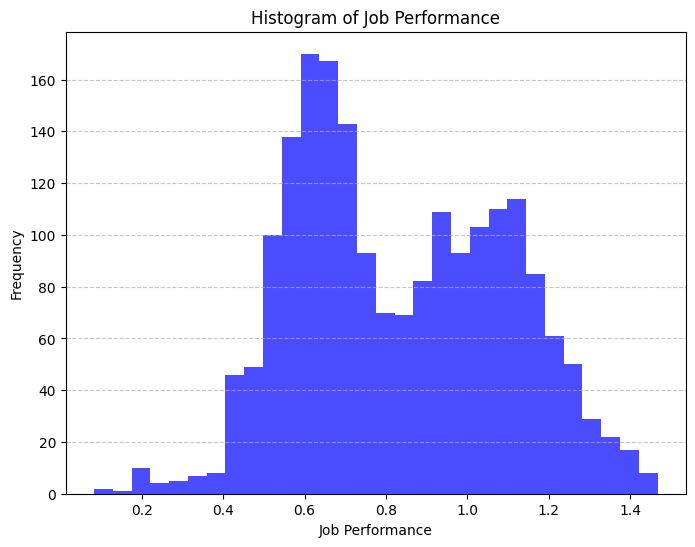

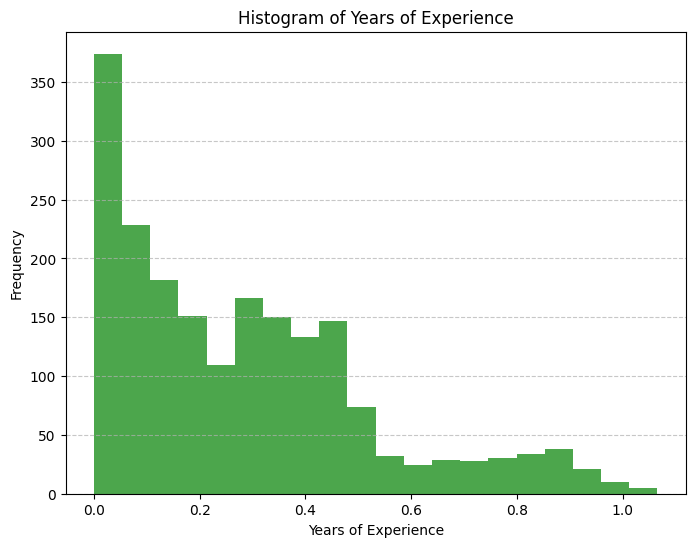

In [ ]:

# Plot histogram for 'Job_performance'
plt.figure(figsize=(8, 6))
plt.hist(augmented_df['Job_performance'], bins=30, color='blue', alpha=0.7)
plt.title('Histogram of Job Performance')
plt.xlabel('Job Performance')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Plot histogram for 'years_of_experience'
plt.figure(figsize=(8, 6))
plt.hist(augmented_df['years_of_experience'], bins=20, color='green', alpha=0.7)
plt.title('Histogram of Years of Experience')
plt.xlabel('Years of Experience')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [ ]:
# Define promotion criteria (can adjust these thresholds as needed)
experience_threshold = 0.2  # Minimum years of experience required for promotion
performance_threshold = 0.3  # Minimum job performance score required for promotion

# Calculate Potential Promotion based on criteria
augmented_df['Potential_promotion'] = ((augmented_df['years_of_experience'] >= experience_threshold) &
                             (augmented_df['Job_performance'] >= performance_threshold)).astype(int)

In [ ]:
augmented_df['Potential_promotion'].value_counts()

1    1064
0     901
Name: Potential_promotion, dtype: int64

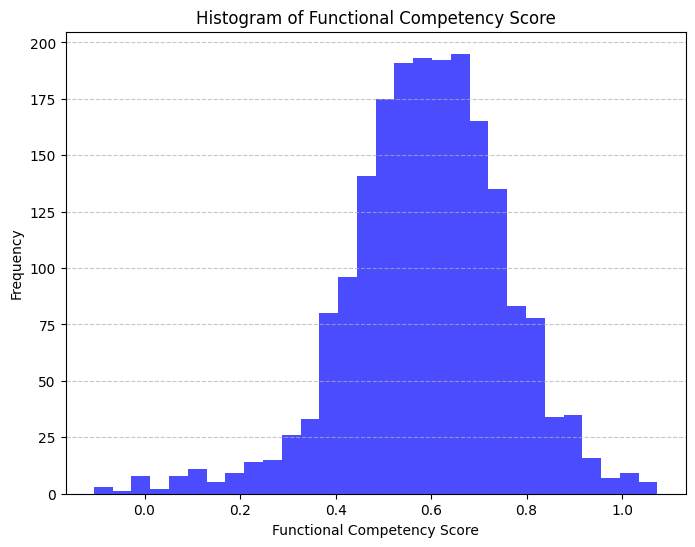

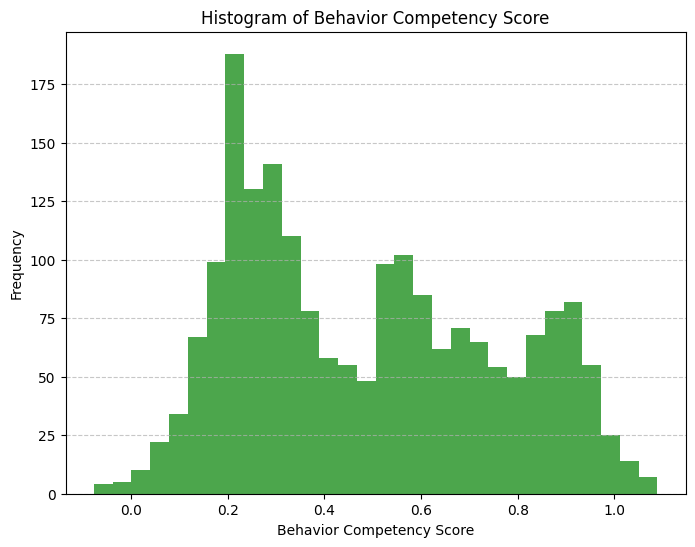

In [ ]:

# Plot histogram for 'functional_competency_score'
plt.figure(figsize=(8, 6))
plt.hist(augmented_df['functional_competency_score'], bins=30, color='blue', alpha=0.7)
plt.title('Histogram of Functional Competency Score')
plt.xlabel('Functional Competency Score')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Plot histogram for 'behavior_competency_score'
plt.figure(figsize=(8, 6))
plt.hist(augmented_df['behavior_competency_score'], bins=30, color='green', alpha=0.7)
plt.title('Histogram of Behavior Competency Score')
plt.xlabel('Behavior Competency Score')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [ ]:
# Define the criteria for recruitment (can adjust these thresholds)
functional_competency_threshold = 0.5
behavior_competency_threshold = 0.25

# Create the Recruitment Goal column based on the criteria and interview status
augmented_df['Recruitment_goal'] = augmented_df.apply(lambda row: 1 if (row['call_for_interview'] == 1 and
                                                      row['functional_competency_score'] >= functional_competency_threshold and
                                                      row['behavior_competency_score'] >= behavior_competency_threshold)
                                  else 0, axis=1)


In [ ]:
augmented_df['Recruitment_goal'].value_counts()

1    1000
0     965
Name: Recruitment_goal, dtype: int64

In [ ]:
print(augmented_df['Job_performance'].unique())
print(augmented_df['Potential_promotion'].unique())
print(augmented_df['Recruitment_goal'].unique())

[1.13411316 0.56756085 0.48589658 ... 1.14222283 0.38272301 1.15032562]
[1 0]
[1 0]


In [ ]:
augmented_df.dtypes

years_of_experience            float64
functional_competency_score    float64
top1_skills_score              float64
top2_skills_score              float64
top3_skills_score              float64
behavior_competency_score      float64
top1_behavior_skill_score      float64
top2_behavior_skill_score      float64
top3_behavior_skill_score      float64
call_for_interview             float64
ID                               int64
Job_performance                float64
Potential_promotion              int64
Recruitment_goal                 int64
dtype: object

In [ ]:
augmented_df.head()

,years_of_experience,functional_competency_score,top1_skills_score,top2_skills_score,top3_skills_score,behavior_competency_score,top1_behavior_skill_score,top2_behavior_skill_score,top3_behavior_skill_score,call_for_interview,ID,Job_performance,Potential_promotion,Recruitment_goal
0,0.333333,0.749498,0.777778,0.7,0.8,0.769231,0.931689,0.662042,0.752463,1.0,1,1.134113,1,1
1,0.133333,0.490638,0.777778,0.3,0.4,0.153846,0.352093,0.132231,0.316905,0.0,2,0.567561,0,0
2,0.000000,0.460256,0.444444,0.3,0.3,0.051282,0.052347,0.089765,0.254859,0.0,3,0.485897,0,0
3,0.000000,0.507347,0.555556,0.4,0.5,0.384615,0.309913,0.289758,0.440784,0.0,4,0.699654,0,0
4,0.400000,0.662020,0.666667,0.7,0.5,0.461538,0.497929,0.397544,0.392760,1.0,5,0.892789,1,1


In [ ]:
augmented_df.columns

Index(['years_of_experience', 'functional_competency_score',
       'top1_skills_score', 'top2_skills_score', 'top3_skills_score',
       'behavior_competency_score', 'top1_behavior_skill_score',
       'top2_behavior_skill_score', 'top3_behavior_skill_score',
       'call_for_interview', 'ID', 'Job_performance', 'Potential_promotion',
       'Recruitment_goal'],
      dtype='object')

**Preprocessing**`

In [ ]:
# Check for missing values in each column
missing_values = augmented_df.isnull().sum()

# Display columns with missing values and the count of missing values
print("Columns with Missing Values:")
print(missing_values[missing_values > 0])

Columns with Missing Values:
Series([], dtype: int64)


In [ ]:
scaler = StandardScaler()
numerical_columns = ['years_of_experience', 'functional_competency_score', 'top1_skills_score', 'top2_skills_score',
                     'top3_skills_score', 'behavior_competency_score', 'top1_behavior_skill_score',
                     'top2_behavior_skill_score', 'top3_behavior_skill_score']

augmented_df[numerical_columns] = scaler.fit_transform(augmented_df[numerical_columns])


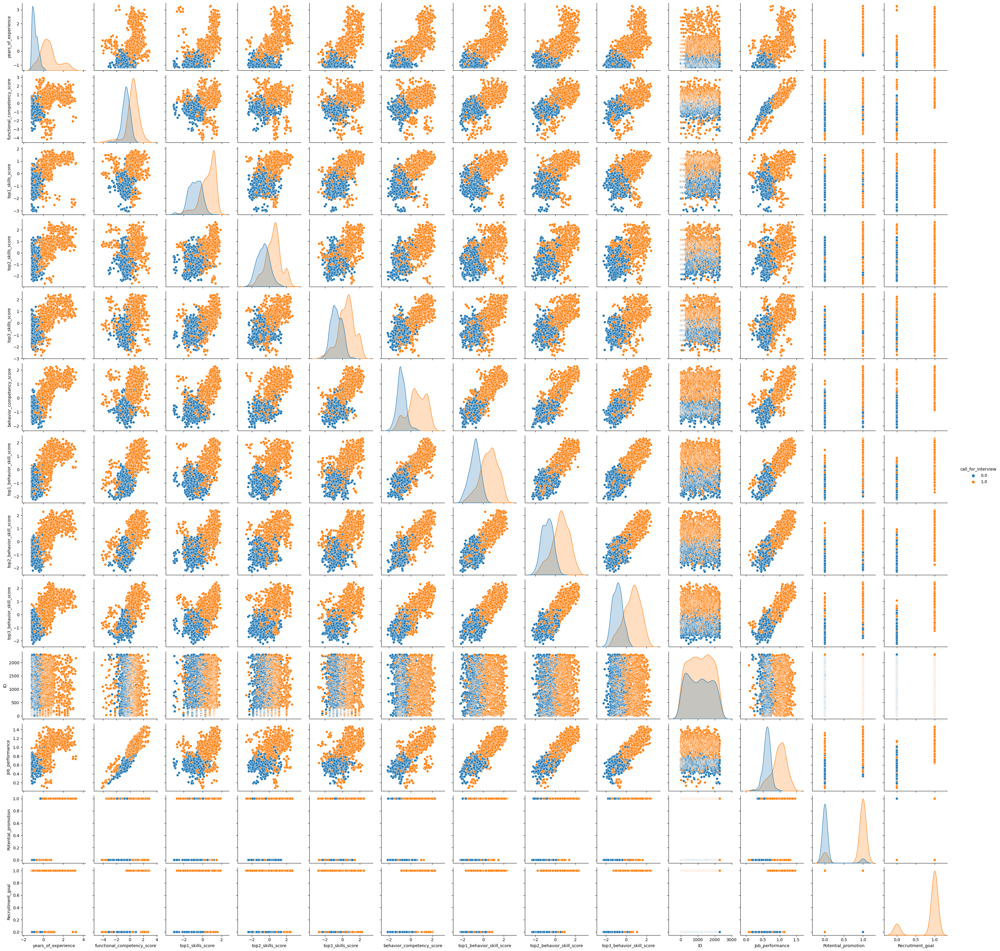

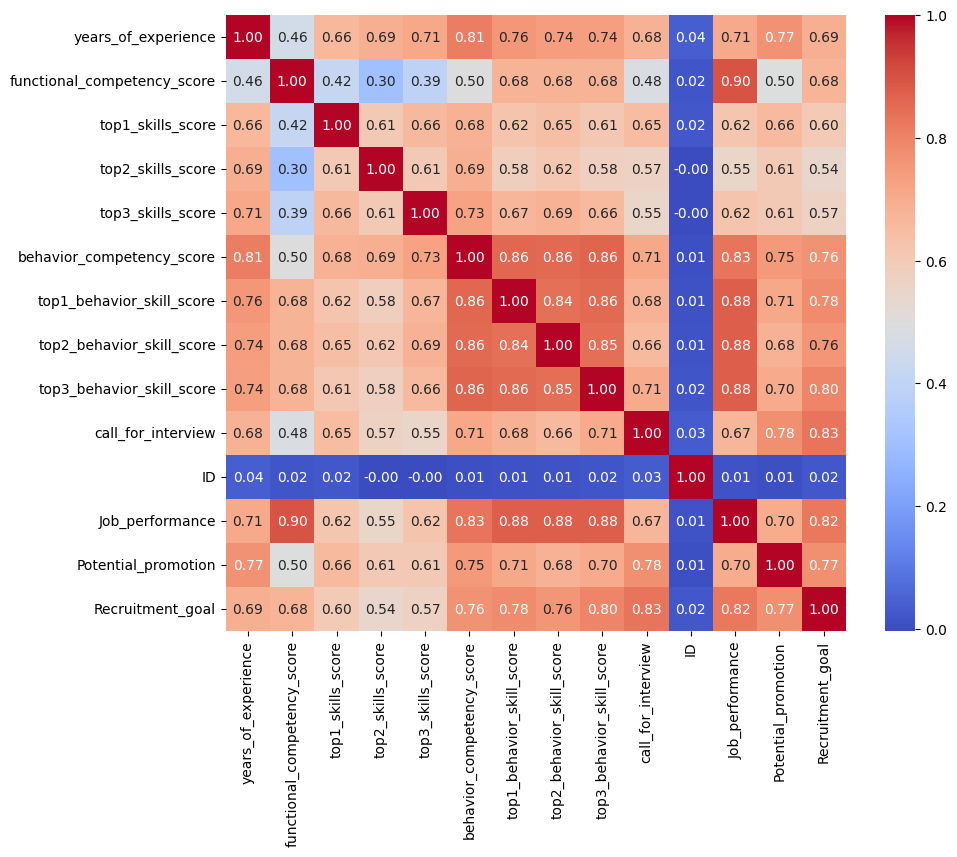

In [ ]:
# Summary statistics
summary_stats = augmented_df.describe()

# Visualize data distributions
sns.pairplot(augmented_df, hue='call_for_interview', diag_kind='kde')
plt.show()

# Correlation matrix
corr_matrix = augmented_df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

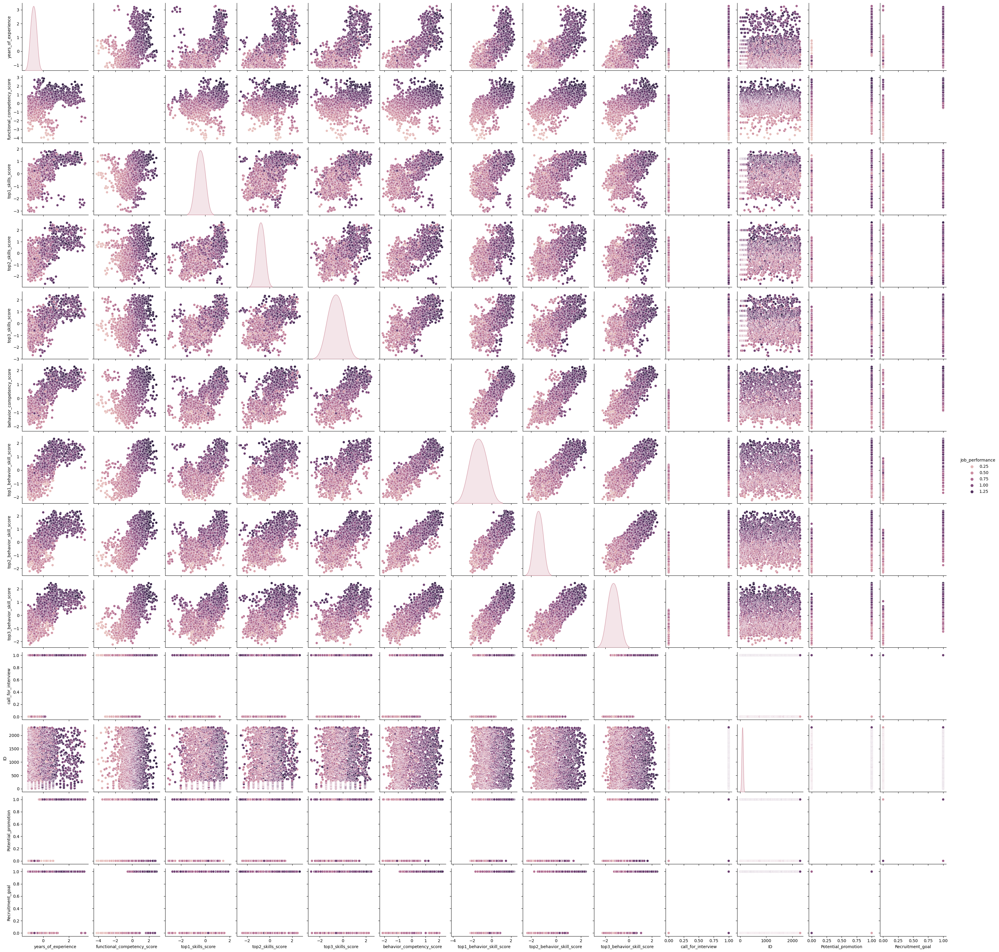

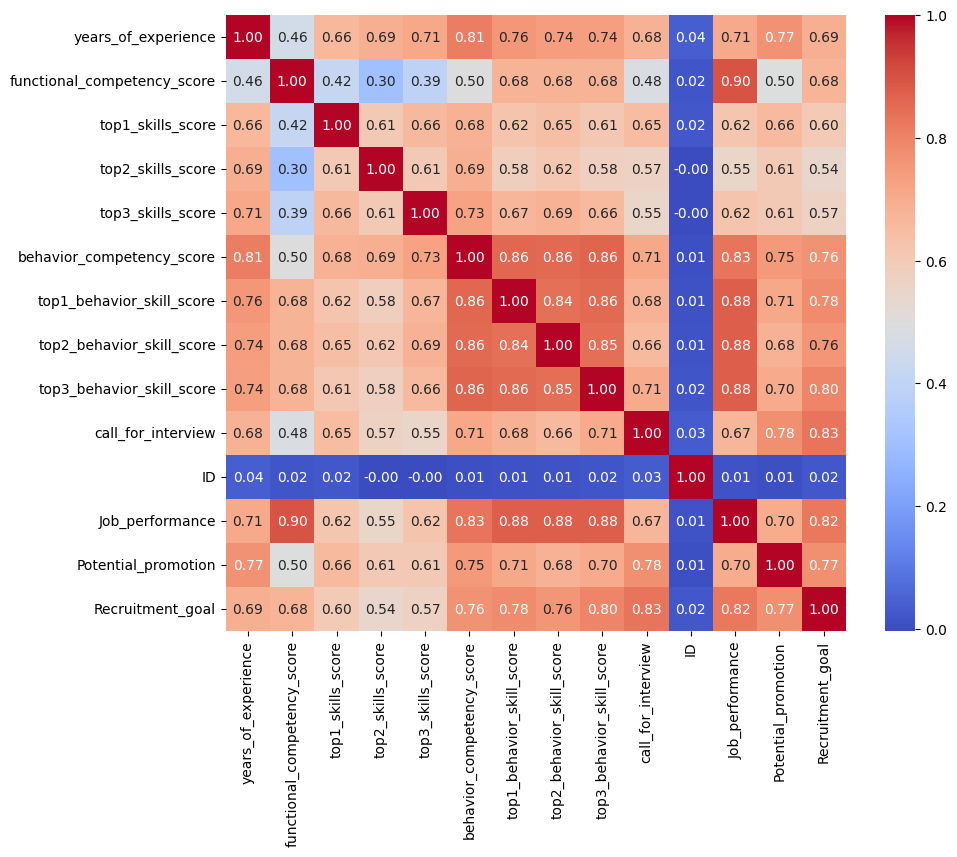

In [ ]:
# Summary statistics
summary_stats = augmented_df.describe()

# Visualize data distributions
sns.pairplot(augmented_df, hue='Job_performance', diag_kind='kde')
plt.show()

# Correlation matrix
corr_matrix = augmented_df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

# Ajuster la distribution de la colonne **Job_performance**

In [ ]:

# Example data (replace with your 'Job_performance' data)
job_performance_data = augmented_df['Job_performance']

# Perform the Shapiro-Wilk test
statistic, p_value = stats.shapiro(job_performance_data)

# Check the p-value
alpha = 0.05  # Significance level
if p_value > alpha:
    print("Job_performance appears to follow a normal distribution (fail to reject H0)")
else:
    print("Job_performance does not appear to follow a normal distribution (reject H0)")

Job_performance appears to follow a normal distribution (fail to reject H0)


In [ ]:
# Apply the Box-Cox transformation to the 'Job_performance' column
transformed_job_performance, lambda_best_fit = stats.boxcox(augmented_df['Job_performance'])

# Update the 'Job_performance' column in your DataFrame with the transformed values
augmented_df['Job_performance'] = transformed_job_performance

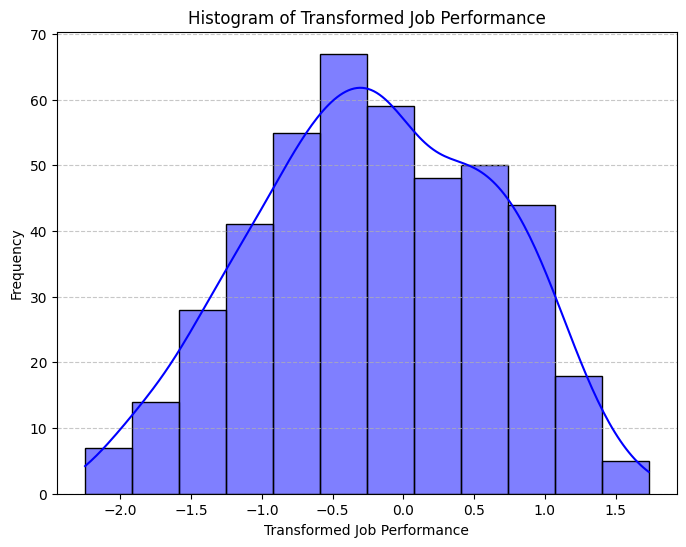

Shapiro-Wilk Test Statistic: 0.9889445304870605
Shapiro-Wilk Test p-value: 0.002231151331216097


In [ ]:
# Check the distribution of the transformed 'Job_performance'
plt.figure(figsize=(8, 6))
sns.histplot(augmented_df['Job_performance'], kde=True, color='blue')
plt.title('Histogram of Transformed Job Performance')
plt.xlabel('Transformed Job Performance')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Check the normality of the transformed 'Job_performance' using the Shapiro-Wilk test
shapiro_test = stats.shapiro(augmented_df['Job_performance'])
print(f"Shapiro-Wilk Test Statistic: {shapiro_test.statistic}")
print(f"Shapiro-Wilk Test p-value: {shapiro_test.pvalue}")


In [ ]:
augmented_df.columns

Index(['years_of_experience', 'functional_competency_score',
       'top1_skills_score', 'top2_skills_score', 'top3_skills_score',
       'behavior_competency_score', 'top1_behavior_skill_score',
       'top2_behavior_skill_score', 'top3_behavior_skill_score',
       'call_for_interview', 'ID', 'Job_performance', 'Potential_promotion',
       'Recruitment_goal'],
      dtype='object')

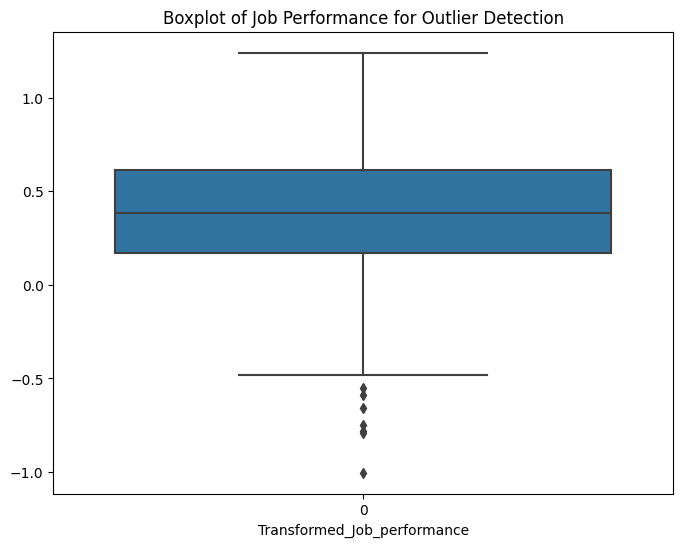

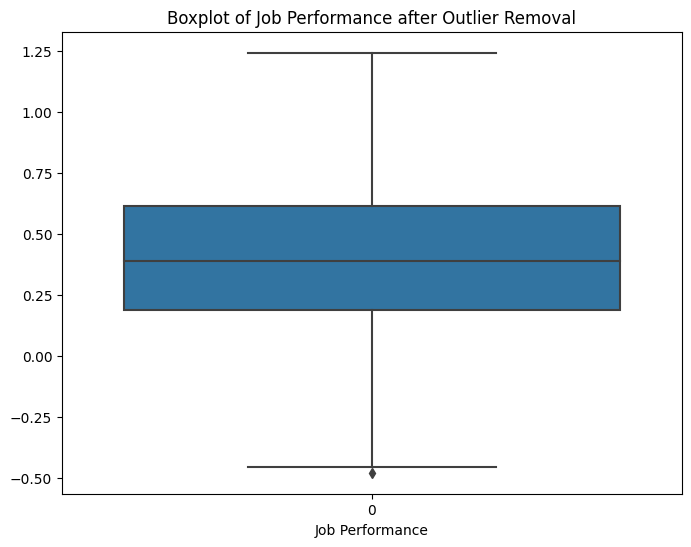

In [ ]:
data = augmented_df
# Create a boxplot to visualize outliers in the 'Job_performance' column
plt.figure(figsize=(8, 6))
sns.boxplot(data=data['Transformed_Job_performance'])
plt.title('Boxplot of Job Performance for Outlier Detection')
plt.xlabel('Transformed_Job_performance')
plt.show()

# Define a function to detect and handle outliers for a specific column
def handle_outliers(data, column_name):
    q1 = data[column_name].quantile(0.25)
    q3 = data[column_name].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Identify and handle outliers
    outliers = data[(data[column_name] < lower_bound) | (data[column_name] > upper_bound)]
    data = data[~data.index.isin(outliers.index)]

    return data

# Handle outliers in the 'Job_performance' column
data_cleaned = handle_outliers(data, 'Transformed_Job_performance')

# Replot the boxplot after outlier removal
plt.figure(figsize=(8, 6))
sns.boxplot(data=data_cleaned['Transformed_Job_performance'])
plt.title('Boxplot of Job Performance after Outlier Removal')
plt.xlabel('Job Performance')
plt.show()

# Now, data_cleaned contains the dataset with outliers removed for 'Job_performance'


In [ ]:
!pip install fairlearn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.5/231.5 kB 3.0 MB/s eta 0:00:00


## Apply a fairness mitigation technique




In [ ]:
# Import necessary libraries from Fairlearn
from fairlearn.metrics import selection_rate, demographic_parity_difference, equalized_odds_difference
from fairlearn.postprocessing import ThresholdOptimizer
from fairlearn.reductions import GridSearch

# Define sensitive features (replace 'sensitive_feature' with the actual feature that represents the sensitive attribute)
#sensitive_feature = augmented_df['sensitive_feature']

# Define predictions and true labels (replace 'predictions' and 'true_labels' with the actual variables)
predictions = ...  #  model predictions
true_labels = ...  #  true labels

# Calculate and print fairness metrics
print("Fairness Metrics:")

#print("Selection Rate Difference:", selection_rate(true_labels, predictions, sensitive_feature))
#print("Demographic Parity Difference:", demographic_parity_difference(true_labels, predictions, sensitive_feature))
#print("Equalized Odds Difference:", equalized_odds_difference(true_labels, predictions, sensitive_feature))

# Apply a fairness mitigation technique if necessary
# For example, to achieve demographic parity, you can use the ThresholdOptimizer
# Define your constraints (e.g., demographic parity) and the threshold_optimizer
constraints = "demographic_parity"
threshold_optimizer = ThresholdOptimizer(estimator=LogisticRegression(solver='liblinear'))
#threshold_optimizer.fit(predictions, true_labels, sensitive_features=sensitive_feature, constraints=constraints)

# Apply the threshold optimizer to your predictions to mitigate bias
#fair_predictions = threshold_optimizer.predict(predictions, sensitive_features=sensitive_feature)

# Now 'fair_predictions' contains predictions that satisfy the specified fairness constraint


Fairness Metrics:


# **Modeling**




In [ ]:
# Splitting Data into Train and Test Sets for Classification Tasks
X_classification = augmented_df.drop(['call_for_interview', 'Potential_promotion', 'Recruitment_goal'], axis=1)
y_call_for_interview = augmented_df['call_for_interview']
y_potential_promotion = augmented_df['Potential_promotion']
y_recruitment_goal = augmented_df['Recruitment_goal']

# Splitting for binary classification (call_for_interview, Potential_promotion, Recruitment_goal)
X_train_call, X_test_call, y_train_call, y_test_call = train_test_split(X_classification, y_call_for_interview, test_size=0.2, random_state=42)
X_train_promotion, X_test_promotion, y_train_promotion, y_test_promotion = train_test_split(X_classification, y_potential_promotion, test_size=0.2, random_state=42)
X_train_recruitment, X_test_recruitment, y_train_recruitment, y_test_recruitment = train_test_split(X_classification, y_recruitment_goal, test_size=0.2, random_state=42)

# Splitting Data into Train and Test Sets for Regression Task (job_performance)
X_regression = augmented_df.drop(['call_for_interview', 'Job_performance','Transformed_Job_performance' , 'Potential_promotion', 'Recruitment_goal'], axis=1)
y_job_performance = augmented_df['Transformed_Job_performance']

X_train_performance, X_test_performance, y_train_performance, y_test_performance = train_test_split(X_regression, y_job_performance, test_size=0.2, random_state=42)

# Now, you have X_train and X_test for classification tasks, and X_train_performance and X_test_performance for regression.
# You can use regression models like Linear Regression for job_performance and classification models for other tasks.


In [ ]:
# Classification model for call_for_interview
model_call_for_interview = LogisticRegression(random_state=42)
model_call_for_interview.fit(X_train_call, y_train_call)

# Make predictions for call_for_interview
y_pred_call = model_call_for_interview.predict(X_test_call)

# Evaluate the model for call_for_interview
accuracy_call = accuracy_score(y_test_call, y_pred_call)
confusion_matrix_call = confusion_matrix(y_test_call, y_pred_call)
classification_report_call = classification_report(y_test_call, y_pred_call)

# Print evaluation results for call_for_interview
print("Classification Model for 'call_for_interview':")
print(f"Accuracy: {accuracy_call}")
print(f"Confusion Matrix:\n{confusion_matrix_call}")
print(f"Classification Report:\n{classification_report_call}")

# Repeat the above steps for Potential_promotion and Recruitment_goal by creating separate models.
# Use the same logic with different variable names (e.g., model_potential_promotion, model_recruitment_goal).


Classification Model for 'call_for_interview':
Accuracy: 0.9391304347826087
Confusion Matrix:
[[221   3]
 [ 25 211]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.99      0.94       224
         1.0       0.99      0.89      0.94       236

    accuracy                           0.94       460
   macro avg       0.94      0.94      0.94       460
weighted avg       0.94      0.94      0.94       460



In [ ]:

# Classification Model for 'Potential_promotion'
model_promotion = LogisticRegression(random_state=42)
model_promotion.fit(X_train_promotion, y_train_promotion)
y_pred_promotion = model_promotion.predict(X_test_promotion)

# Evaluate the model
print("Classification Model for 'Potential_promotion':")
accuracy_promotion = accuracy_score(y_test_promotion, y_pred_promotion)
print(f"Accuracy: {accuracy_promotion}")
confusion_matrix_promotion = confusion_matrix(y_test_promotion, y_pred_promotion)
print("Confusion Matrix:")
print(confusion_matrix_promotion)
classification_report_promotion = classification_report(y_test_promotion, y_pred_promotion)
print("Classification Report:")
print(classification_report_promotion)


Classification Model for 'Potential_promotion':
Accuracy: 0.95
Confusion Matrix:
[[190   4]
 [ 16 190]]
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.98      0.95       194
           1       0.98      0.92      0.95       206

    accuracy                           0.95       400
   macro avg       0.95      0.95      0.95       400
weighted avg       0.95      0.95      0.95       400



In [ ]:

# Classification Model for 'Recruitment_goal'
model_recruitment = LogisticRegression(random_state=42)
model_recruitment.fit(X_train_recruitment, y_train_recruitment)
y_pred_recruitment = model_recruitment.predict(X_test_recruitment)

# Evaluate the model
print("Classification Model for 'Recruitment_goal':")
accuracy_recruitment = accuracy_score(y_test_recruitment, y_pred_recruitment)
print(f"Accuracy: {accuracy_recruitment}")
confusion_matrix_recruitment = confusion_matrix(y_test_recruitment, y_pred_recruitment)
print("Confusion Matrix:")
print(confusion_matrix_recruitment)
classification_report_recruitment = classification_report(y_test_recruitment, y_pred_recruitment)
print("Classification Report:")
print(classification_report_recruitment)


Classification Model for 'Recruitment_goal':
Accuracy: 0.94
Confusion Matrix:
[[315  12]
 [ 12  61]]
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       327
           1       0.84      0.84      0.84        73

    accuracy                           0.94       400
   macro avg       0.90      0.90      0.90       400
weighted avg       0.94      0.94      0.94       400



In [ ]:


# Regression Model for 'Job_performance'
model_performance = RandomForestRegressor(n_estimators=100, random_state=42)  # You can adjust hyperparameters
model_performance.fit(X_train_performance, y_train_performance)
y_pred_performance = model_performance.predict(X_test_performance)

# Evaluate the model for 'Job_performance'
mse_performance = mean_squared_error(y_test_performance, y_pred_performance)
r2_performance = r2_score(y_test_performance, y_pred_performance)

# Print evaluation results for 'Job_performance'
print("Regression Model for 'Job_performance':")
print(f"Mean Squared Error (MSE): {mse_performance}")
print(f"R-squared (R2) Score: {r2_performance}")


Regression Model for 'Job_performance':
Mean Squared Error (MSE): 0.006985999297917444
R-squared (R2) Score: 0.9463485702370178


# **Evaluation**

In [ ]:
# Example data for prediction
new_data = pd.DataFrame({
    'years_of_experience': [2.5],
    'functional_competency_score': [0.8],
    'top1_skills_score': [0.7],
    'top2_skills_score': [0.9],
    'top3_skills_score': [0.8],
    'behavior_competency_score': [0.7],
    'top1_behavior_skill_score': [0.6],
    'top2_behavior_skill_score': [0.7],
    'top3_behavior_skill_score': [0.5],
    'Job_performance': [0.85]  # Provide a value for 'Job_performance'
})


# Predict 'call_for_interview' for the new data
prediction_call = model_call_for_interview.predict(new_data)

# Predict 'Potential_promotion' for the new data
prediction_promotion = model_promotion.predict(new_data)

# Predict 'Recruitment_goal' for the new data
prediction_recruitment = model_recruitment.predict(new_data)



# Print predictions
print("Predictions for 'call_for_interview':", prediction_call)
print("Predictions for 'Potential_promotion':", prediction_promotion)
print("Predictions for 'Recruitment_goal':", prediction_recruitment)


Predictions for 'call_for_interview': [1.]
Predictions for 'Potential_promotion': [1]
Predictions for 'Recruitment_goal': [0]


In [ ]:
# Assuming you have the trained model stored in `model_performance`

# Create a DataFrame for new data
new_data1 = pd.DataFrame({
    'years_of_experience': [2.5],
    'functional_competency_score': [0.8],
    'top1_skills_score': [0.7],
    'top2_skills_score': [0.9],
    'top3_skills_score': [0.8],
    'behavior_competency_score': [0.7],
    'top1_behavior_skill_score': [0.6],
    'top2_behavior_skill_score': [0.7],
    'top3_behavior_skill_score': [0.5],
})

# Make predictions for 'Job_performance' on new_data1
y_pred_performance = model_performance.predict(new_data1)

# Print predictions
print("Predictions for 'Job_performance':", y_pred_performance)


Predictions for 'Job_performance': [0.43678099]
